In [ ]:
#@title General Imports +

from google.colab import drive
drive.mount('/content/drive/')

!git clone https://github.com/seungheondoh/lp-music-caps.git
%cd lp-music-caps/
!pip install -e .

import os, subprocess, csv, random, sys
from IPython.display import clear_output, display, Audio
import ipywidgets as widgets

from PIL import Image
from os import listdir
from os.path import isfile, join
from pathlib import Path

import numpy ####
import scipy####maybe get rid
from random import randrange
!pip install librosa ## maybe get this one out
import librosa

%cd lpmc/music_captioning/
!wget https://huggingface.co/seungheondoh/lp-music-caps/resolve/main/transfer.pth -O exp/transfer/lp_music_caps/last.pth
!python3 captioning.py --gpu 0 --audio_path /content/drive/MyDrive/audio_samples/Lift_Off_30s.wav > /content/drive/MyDrive/music_desc/music_desc.txt

clear_output()

In [ ]:
#@title Mount Google Drive / Assign Directories +
#from google.colab import drive
#drive.mount('/content/drive/')

IMAGE_DIR = '/content/drive/MyDrive/image_samples' #@param
AUDIO_DIR = '/content/drive/MyDrive/audio_samples'#@param
IMAGE_DESCRIPTION_PATH = '/content/drive/MyDrive/image_desc'#@param
SAVE_DIR = "/content/drive/MyDrive/results"#@param
most_recent_save_path = ''

from os import listdir

file_names = os.listdir(AUDIO_DIR)
print(file_names[:10])
# Add all sample files in directory to list
#file_names = [f for f in listdir(AUDIO_DIR) if isfile(join(AUDIO_DIR, f))]

['PinkPantheressBo.wav', '.ipynb_checkpoints', 'Tears_in_the_Rai.wav', 'Can_You_Hear_The_Musi.wav', '318111642-7db11dd8-a384-42f7-bc1c-6b6acff63c99.wav', 'politik_5sec_sample.wav', 'politik_5sec.wav', '1975_bagsy_20sec.wav', '1975_bagsy_30sec.wav', 'Lift_Off_30s.wav']


In [ ]:
#@title Stable Diffusion Image Generation Setup kad 2.1 +
#==0.11.1
!pip install diffusers
!pip install transformers scipy ftfy accelerate

from diffusers import KandinskyPriorPipeline, KandinskyPipeline
from diffusers.utils import load_image, make_image_grid
import torch

prior_pipeline = KandinskyPriorPipeline.from_pretrained("kandinsky-community/kandinsky-2-1-prior", torch_dtype=torch.float16, use_safetensors=True).to("cuda")



clear_output()

In [ ]:
#@title Stable Diffusion Image Generation Setup kad 2.2 +
#==0.11.1
!pip install diffusers
!pip install transformers scipy ftfy accelerate

from diffusers import KandinskyV22PriorPipeline, KandinskyV22Pipeline
from diffusers.utils import load_image, make_image_grid
import PIL
import torch
from torchvision import transforms

pipe_prior = KandinskyV22PriorPipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-prior", torch_dtype=torch.float16
)
pipe_prior.to("cuda")


clear_output()

In [ ]:
#@title music_desc file to dict variable +

import ast

# Initialize an empty list to store the dictionaries
music_tags = []

# Open the file and read line by line
with open('/content/drive/MyDrive/music_desc/music_desc.txt', 'r') as file:
    for line in file:
        # Strip any extra whitespace from the line and convert the string to a dictionary
        entry = ast.literal_eval(line.strip())
        # Append the dictionary to the list
        music_tags.append(entry)

# Print the list to verify
for entry in music_tags:
    print(entry)


{'text': 'mysterious, simple, calming, mellow.', 'time': '0:00-10:00'}
{'text': 'mysterious, simple, calming, mellow.', 'time': '10:00-20:00'}
{'text': 'more energetic, groovy, more complex.', 'time': '20:00-30:00'}


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You are using a model of type xlm-roberta to instantiate a model of type M-CLIP. This is not supported for all configurations of models and can yield errors.


['This music is a Western Classical', 'The tempo is slow with a melancholic violin harmony', 'The music is soft, mellifluous, rich, full bodied, elegant and exquisite']
+-+-+-+-+-+-+-+-+-+-+-+
This music is a Western Classical. The tempo is slow with a melancholic violin harmony. The music is soft, mellifluous, rich, full bodied, elegant and exquisite. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

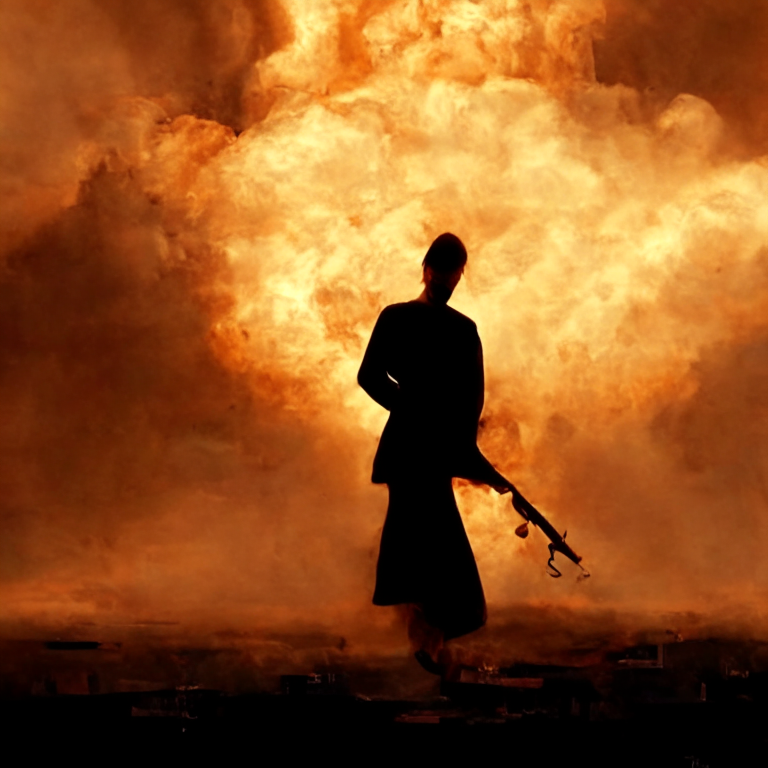

['The low quality recording features a classical song that consists of a sustained string melody, sustained strings melody and woodwinds melody playing over it', 'It sounds suspenseful and intense']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a classical song that consists of a sustained string melody, sustained strings melody and woodwinds melody playing over it. It sounds suspenseful and intense. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

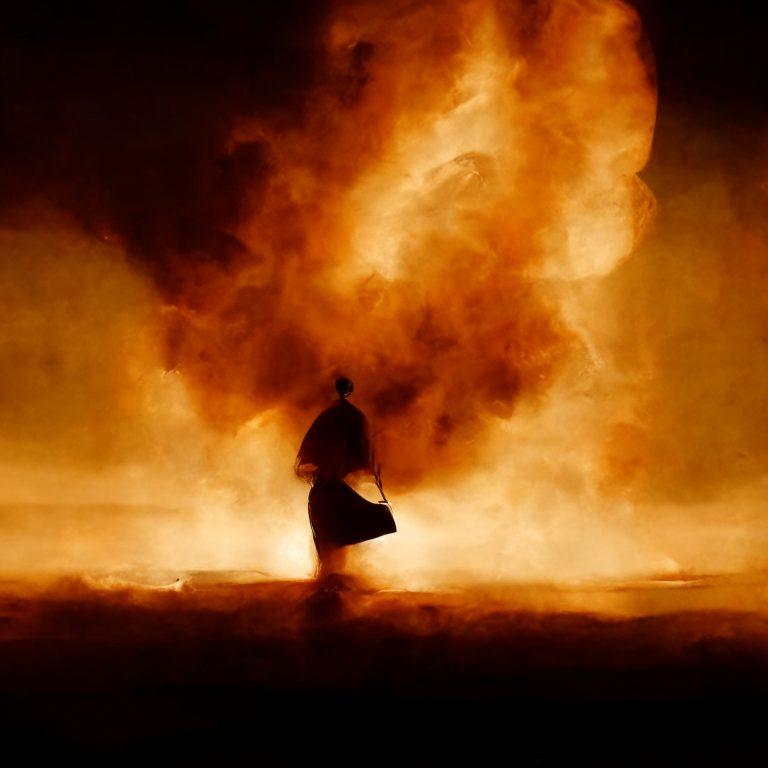

['The low quality recording features a sustained string melody, followed by sustained strings melody, low synth pad and mellow bells melody', 'It sounds suspenseful and intense']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a sustained string melody, followed by sustained strings melody, low synth pad and mellow bells melody. It sounds suspenseful and intense. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

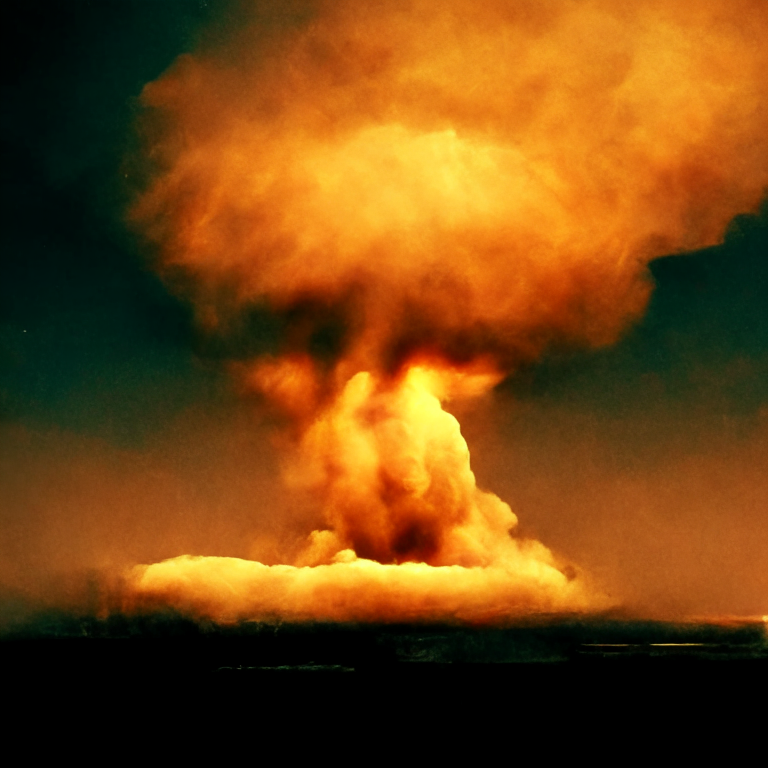

['The low quality recording features a huge church organ chord progression, followed by shimmering cymbals, played in the background', 'It sounds epic and powerful']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a huge church organ chord progression, followed by shimmering cymbals, played in the background. It sounds epic and powerful. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

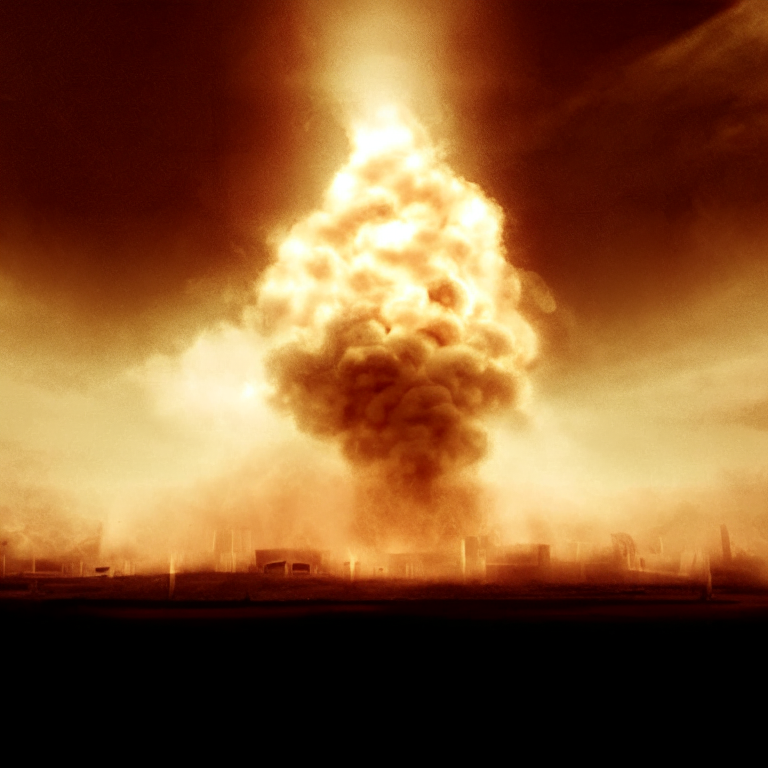

['The low quality recording features a cover of a classical song that consists of sustained strings melody, sustained synth bass and mellow strings melody', 'It sounds emotional, passionate and the recording is noisy and in mono']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a cover of a classical song that consists of sustained strings melody, sustained synth bass and mellow strings melody. It sounds emotional, passionate and the recording is noisy and in mono. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

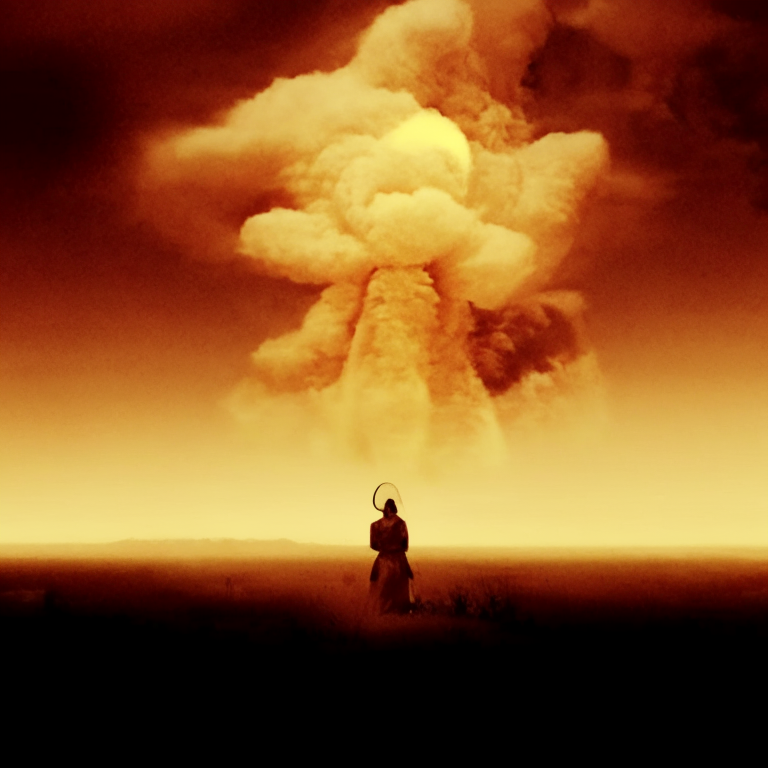

['The low quality recording features a repetitive synth lead melody played over playback that consists of a groovy piano melody, repetitive synth bass and sustained strings melody', 'It sounds uplifting, soulful and passionate']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a repetitive synth lead melody played over playback that consists of a groovy piano melody, repetitive synth bass and sustained strings melody. It sounds uplifting, soulful and passionate. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

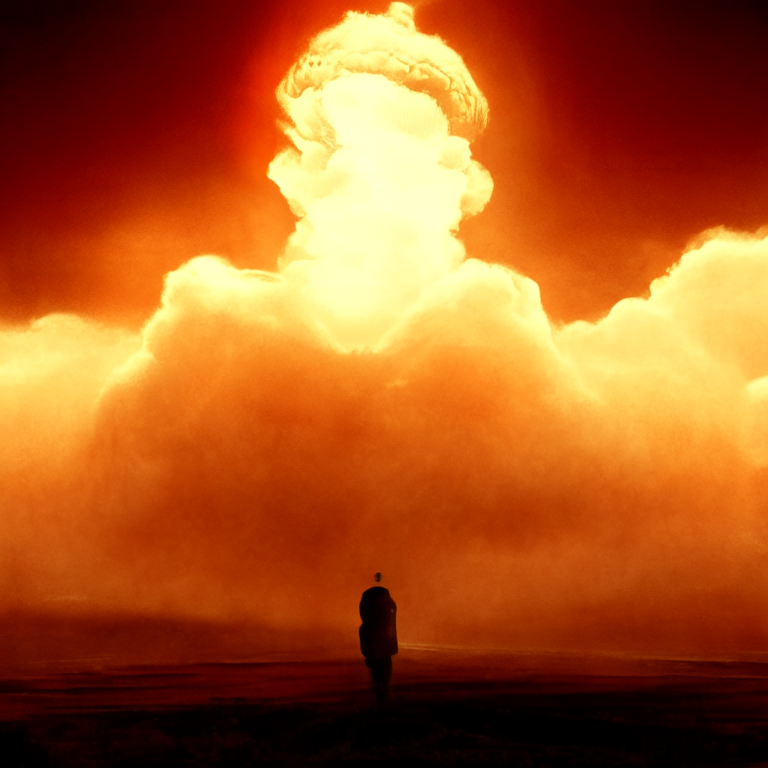

['The low quality recording features a trance song that consists of a repetitive piano melody played over sustained strings melody, shimmering cymbals and groovy bass', 'It sounds uplifting, soulful and passionate']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a trance song that consists of a repetitive piano melody played over sustained strings melody, shimmering cymbals and groovy bass. It sounds uplifting, soulful and passionate. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

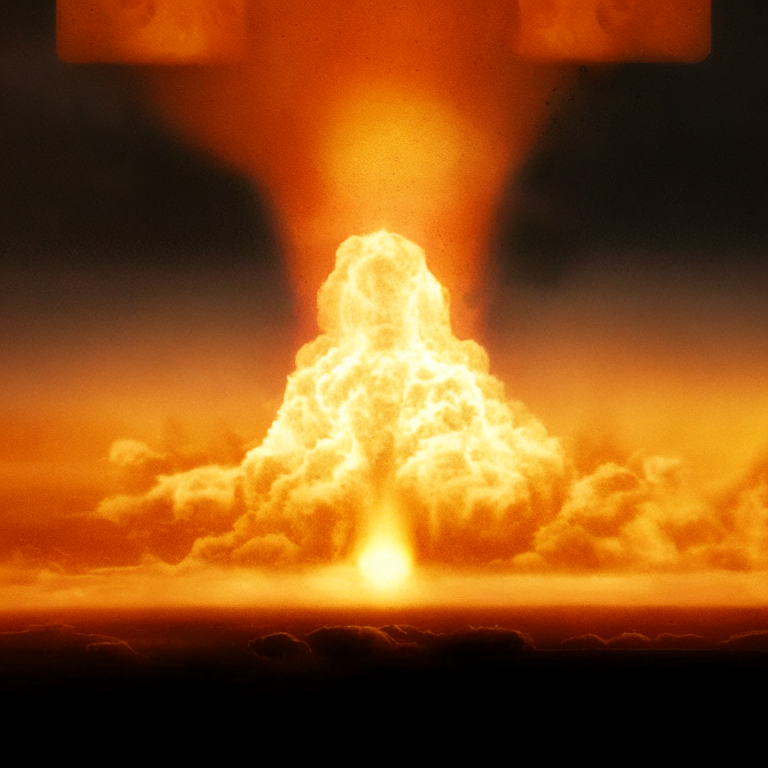

['The low quality recording features a live performance of a classical song and it consists of a groovy piano melody, followed by shimmering cymbals', 'It sounds uplifting, soulful and passionate']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a live performance of a classical song and it consists of a groovy piano melody, followed by shimmering cymbals. It sounds uplifting, soulful and passionate. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

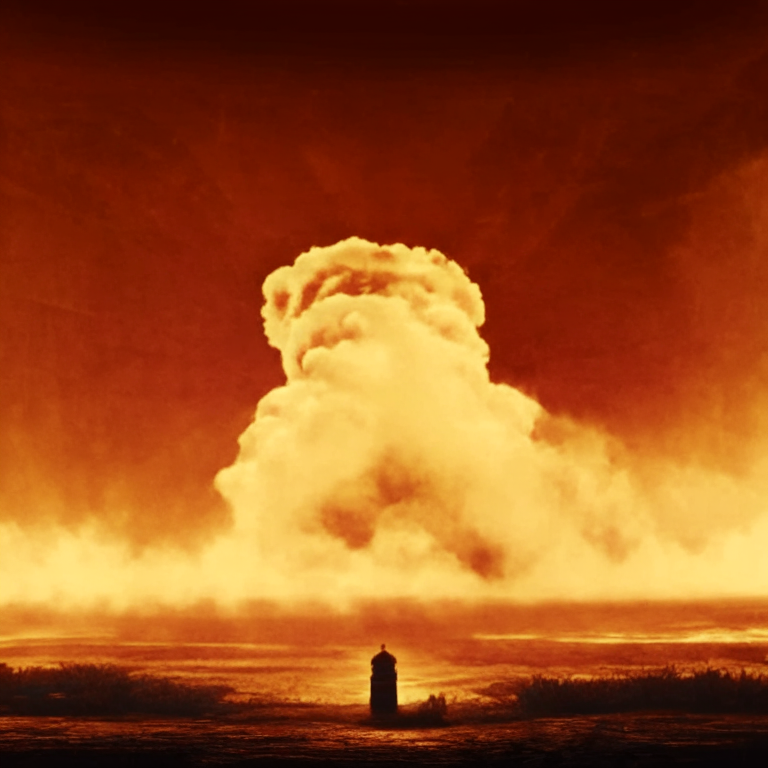

['The low quality recording features a cover of a pop song that consists of an arpeggiated synth bass melody, sustained strings melody and groovy piano melody', 'It sounds uplifting, soulful and passionate']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a cover of a pop song that consists of an arpeggiated synth bass melody, sustained strings melody and groovy piano melody. It sounds uplifting, soulful and passionate. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

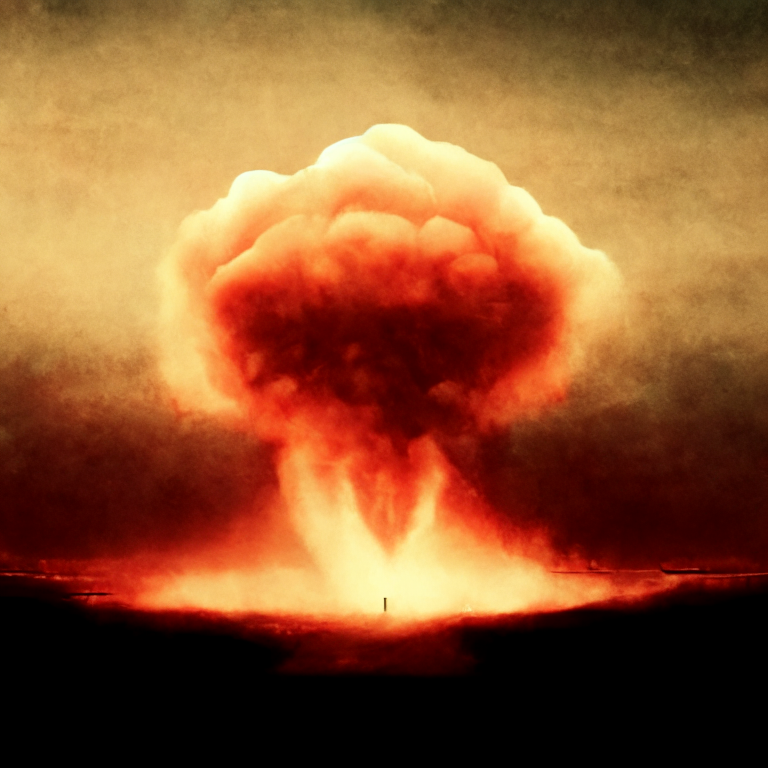

['The low quality recording features a cover of a pop song that consists of an arpeggiated synth bass melody played over groovy piano melody, shimmering hi hats, punchy kick and snare hits', 'It sounds uplifting, energetic and passionate']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a cover of a pop song that consists of an arpeggiated synth bass melody played over groovy piano melody, shimmering hi hats, punchy kick and snare hits. It sounds uplifting, energetic and passionate. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

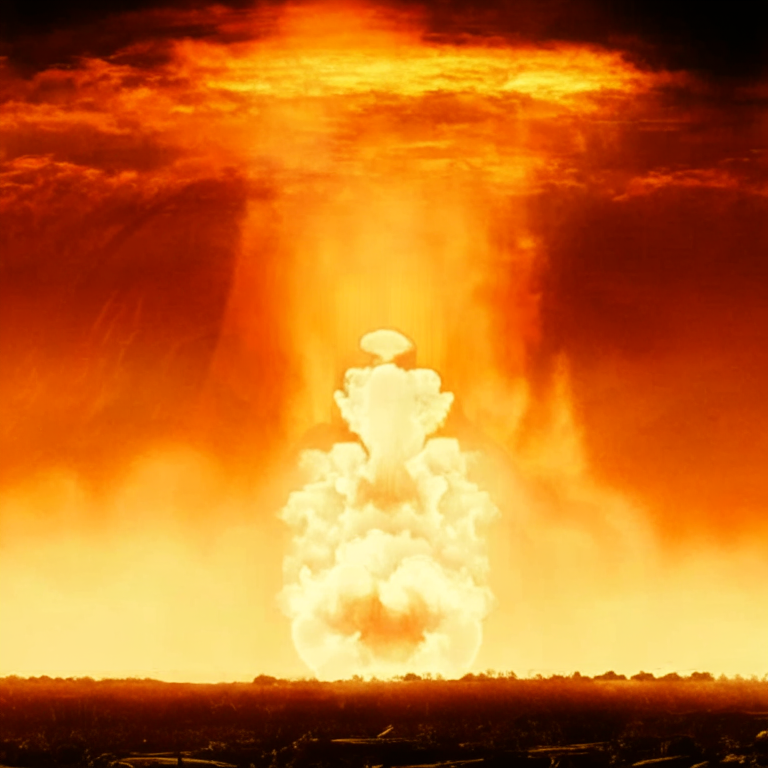

['The low quality recording features a reggae song that consists of a short snippet of breathy flute melody played over groovy bass, wide brass melody and shimmering bells melody', 'It sounds energetic and addictive']
+-+-+-+-+-+-+-+-+-+-+-+
The low quality recording features a reggae song that consists of a short snippet of breathy flute melody played over groovy bass, wide brass melody and shimmering bells melody. It sounds energetic and addictive. 


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

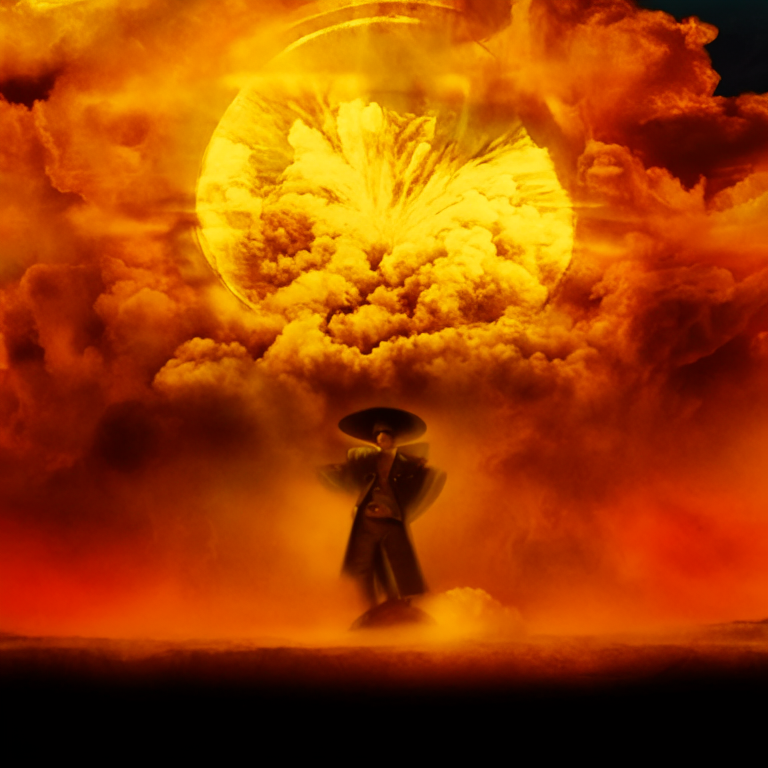

In [ ]:
#@title Image Generation using kadinsky 2.1 +

import os

output_dir = "/content/drive/MyDrive/images_generated_from_song/" # change output path
output_dir.mkdir(exist_ok=True, parents=True)

def format_prompts(prompts):
  img_gen_input = ''
  for prompt in prompts:
    img_gen_input += str(prompt)
    img_gen_input += '. '

  return img_gen_input

img_1 = load_image("/content/drive/MyDrive/image_samples/opp.jpeg")
#img_2 = load_image("/content/drive/MyDrive/image_samples/tt15398776-hero-960x540-moz.jpg")
img_3 = load_image("/content/drive/MyDrive/image_samples/untitled-1_9-1200x675.jpg")

pipeline = KandinskyPipeline.from_pretrained("kandinsky-community/kandinsky-2-1", torch_dtype=torch.float16, use_safetensors=True).to("cuda")

i=0
for entry in music_tags:
  music_prompt = entry.get('text')
  music_prompt_list = music_prompt.split('.')
  music_prompt_list = [sentence.strip() for sentence in music_prompt_list if sentence.strip()]
  print(music_prompt_list)
  print('+-+-+-+-+-+-+-+-+-+-+-+')

  prompts = music_prompt_list #image_descriptors + music_prompt_list

  final_prompt = format_prompts(prompts)
  print(final_prompt)

  images_texts = [final_prompt, img_1, img_3]#[final_prompt, img_1, img_2, img_3]
  weights = [0.3, 0.35, 0.35]#[0.4, 0.2, 0.2, 0.2]

  prompt = ''

  prior_out = prior_pipeline.interpolate(images_texts, weights)

  image = pipeline(prompt, **prior_out, height=768, width=768).images[0]
  display(image)

  save_path = os.path.join(output_dir, f'gen_image_{i}.png')

  image.save(save_path)

  i+=1

  #clear_output()


Loading pipeline components...:   0%|          | 0/3 [00:00<?, ?it/s]

['mysterious, simple, calming, mellow']
+-+-+-+-+-+-+-+-+-+-+-+
mysterious, simple, calming, mellow. 


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['many fingers )))']


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

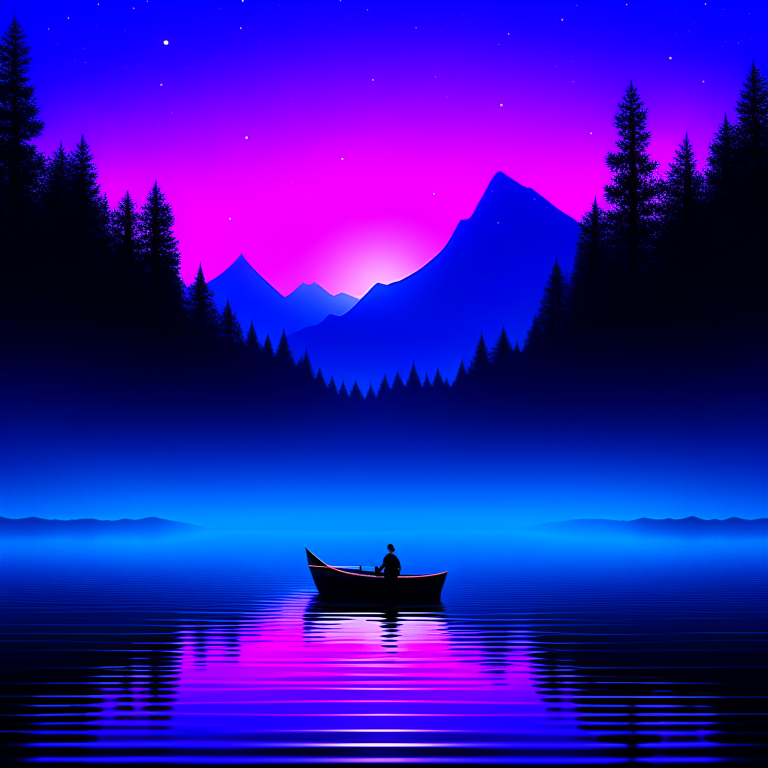

['mysterious, simple, calming, mellow']
+-+-+-+-+-+-+-+-+-+-+-+
mysterious, simple, calming, mellow. 


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['many fingers )))']


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

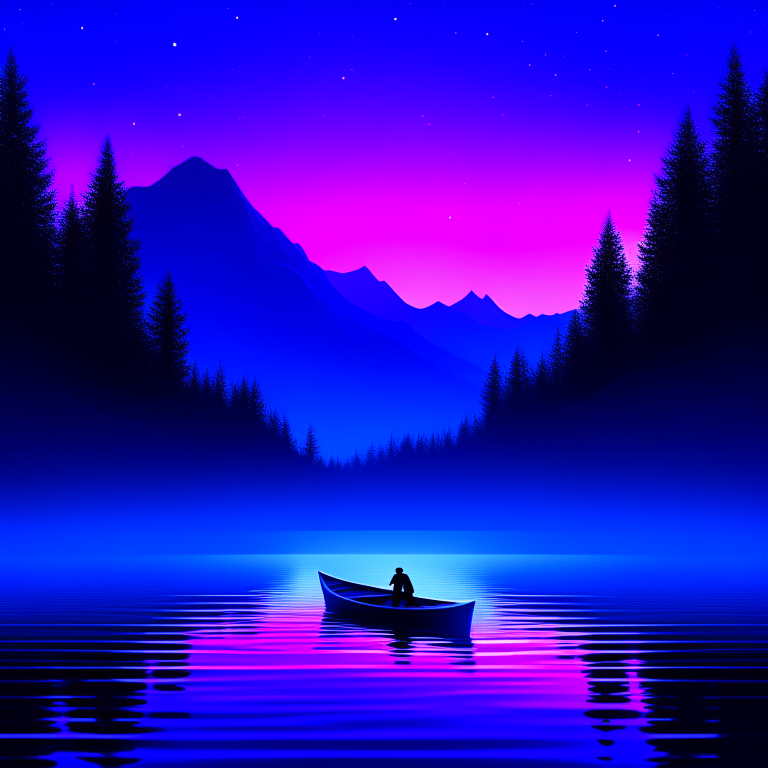

['more energetic, groovy, more complex']
+-+-+-+-+-+-+-+-+-+-+-+
more energetic, groovy, more complex. 


  0%|          | 0/25 [00:00<?, ?it/s]

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['many fingers )))']


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

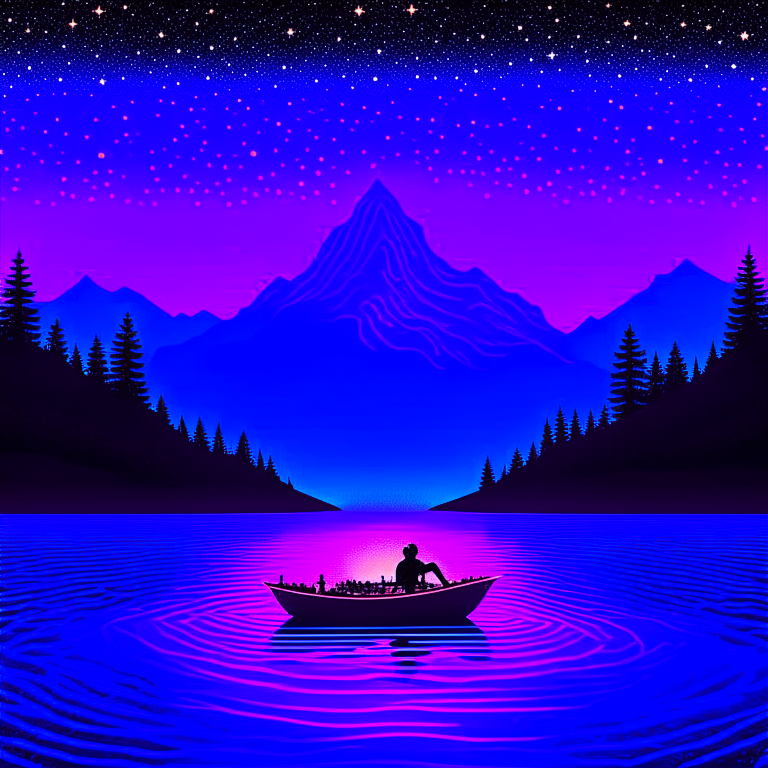

In [ ]:
#@title Image Generation using kadinsky 2.2 +

import os

output_dir = "/content/drive/MyDrive/results/" # change output path

def format_prompts(prompts):
  img_gen_input = ''
  for prompt in prompts:
    img_gen_input += str(prompt)
    img_gen_input += '. '

  return img_gen_input

img_1 = load_image("/content/drive/MyDrive/image_samples/lake_mountain_anime_boat_nature_4k_5k_hd_anime-5120x2880.jpg")
#img_2 = load_image("/content/drive/MyDrive/image_samples/tt15398776-hero-960x540-moz.jpg")

#negative_prior_prompt ='lowres, (((text))), error, cropped, worst quality, low quality, (bad anatomy), jpeg artifacts, ugly, duplicate, morbid, mutilated, out of frame, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, blurry, dehydrated, bad proportions, (((extra limbs))), cloned face, (disfigured), gross proportions, malformed limbs, (((missing arms))), (((missing legs))), (((extra arms))), (((extra legs))), fused fingers, (((too many fingers))), long neck, username, watermark, signature'
negative_prior_prompt ='(((text))), low quality, (bad anatomy), jpeg artifacts, ugly, extra fingers, mutated hands, poorly drawn hands, poorly drawn face, mutation, deformed, (((extra limbs))), (disfigured), malformed limbs, (((missing arms))), (((missing legs))), (((extra arms))), (((extra legs))), fused fingers, (((too many fingers)))'

pipe = KandinskyV22Pipeline.from_pretrained(
    "kandinsky-community/kandinsky-2-2-decoder", torch_dtype=torch.float16
)
pipe.to("cuda")

i=0
for entry in music_tags:
  music_prompt = entry.get('text')
  music_prompt_list = music_prompt.split('.')
  music_prompt_list = [sentence.strip() for sentence in music_prompt_list if sentence.strip()]
  print(music_prompt_list)
  print('+-+-+-+-+-+-+-+-+-+-+-+')

  prompts = music_prompt_list #image_descriptors + music_prompt_list

  final_prompt = format_prompts(prompts)
  print(final_prompt)

  images_texts = [final_prompt, img_1]#[final_prompt, img_1, img_2, img_3]
  weights = [0.3, 0.7]#[0.4, 0.2, 0.2, 0.2]

  prompt = ''

  out = pipe_prior.interpolate(images_texts, weights, negative_prompt=negative_prior_prompt)

  image = pipe(
    image_embeds=out.image_embeds,
    negative_image_embeds=out.negative_image_embeds,
    height=768,
    width=768,
    guidance_scale = 5.0,
    num_inference_steps=50,
  ).images[0]

  display(image)

  save_path = os.path.join(output_dir, f'gen_image_{i}.png')

  image.save(save_path)

  i+=1

  #clear_output()


##Remove possible text from images

In [ ]:
%%capture
!sudo apt install tesseract-ocr

In [ ]:
from tqdm import tqdm
import subprocess

packages_to_install = ["pytesseract"]

for package in tqdm(packages_to_install, desc="Installing packages"):
        subprocess.run(["pip", "install", package], capture_output=True)

Installing packages: 100%|██████████| 1/1 [00:05<00:00,  5.76s/it]


In [ ]:
from PIL import Image
import pytesseract
import cv2
import numpy as np

def remove_text_from_image(image_path):
    # Load image
    image = cv2.imread(image_path)

    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Use OCR to detect text
    boxes = pytesseract.image_to_boxes(gray)

    # Loop through detected text and remove it
    for box in boxes.splitlines():
        b = box.split()
        x, y, w, h = int(b[1]), int(b[2]), int(b[3]), int(b[4])
        cv2.rectangle(image, (x, image.shape[0] - y), (w, image.shape[0] - h), (0, 0, 0), -1)

    # Save the cleaned image
    cleaned_image_path = "/content/drive/MyDrive/results/gen_image_0_cleaned.png"
    cv2.imwrite(cleaned_image_path, image)
    return cleaned_image_path

# Example usage
image_path = "/content/drive/MyDrive/results/gen_image_0.png"
cleaned_image_path = remove_text_from_image(image_path)
print(f"Cleaned image saved at: {cleaned_image_path}")


Cleaned image saved at: /content/drive/MyDrive/results/gen_image_0_cleaned.png


In [ ]:
%%capture
!sudo apt install tesseract-ocr

In [ ]:
from tqdm import tqdm
import subprocess

packages_to_install = ["pytesseract"]

for package in tqdm(packages_to_install, desc="Installing packages"):
        subprocess.run(["pip", "install", package], capture_output=True)

Installing packages: 100%|██████████| 1/1 [00:06<00:00,  6.17s/it]


In [ ]:
# Original script by [Julia Turc and Mihail Eric]]
# GitHub Repository: [https://github.com/iuliaturc/detextify.git]

import pytesseract
from dataclasses import dataclass
from diffusers import StableDiffusionInpaintPipeline
import torch
from PIL import Image, ImageDraw
from typing import Sequence

@dataclass
class TextBox:
  # (x, y) is the top left corner of a rectangle; the origin of the coordinate system is the top-left of the image.
  # x denotes the vertical axis, y denotes the horizontal axis (to match the traditional indexing in a matrix).
  x: int
  y: int
  h: int
  w: int
  text: str = None


class TextDetector:
  def detect_text(self, image_filename: str) -> Sequence[TextBox]:
    pass


class TesseractTextDetector(TextDetector):
  """Uses the `tesseract` OCR library from Google to do text detection."""

  def __init__(self, tesseract_path: str):
    """
    Args:
      tesseract_path: The path where the `tesseract` library is installed, e.g. "/usr/bin/tesseract".
    """
    pytesseract.pytesseract.tesseract_cmd = tesseract_path

  def detect_text(self, image_filename: str) -> Sequence[TextBox]:
    image = Image.open(image_filename)
    data = pytesseract.image_to_data(image, output_type=pytesseract.Output.DICT)
    boxes = [TextBox(l, top, w, h, text)
             for l, top, w, h, text in zip(data["left"], data["top"], data["width"], data["height"], data["text"])
             if text.strip()]
    return boxes


def overlap_x(box1: TextBox, box2: TextBox) -> int:
    return min(box1.x + box1.h, box2.x + box2.h) - max(box1.x, box2.x)


def overlap_y(box1: TextBox, box2: TextBox) -> int:
    return min(box1.y + box1.w, box2.y + box2.w) - max(box1.y, box2.y)


def boxes_intersect(box1: TextBox, box2: TextBox) -> bool:
    return overlap_x(box1, box2) > 0 and overlap_y(box1, box2) > 0


class Inpainter:
  """Interface for in-painting models."""
  # TODO(julia): Run some experiments to determine the best prompt.
  #DEFAULT_PROMPT = "plain background"
  DEFAULT_PROMPT = "The fire mesmerizes with its captivating dance of vibrant colors, rising with a wild grace towards the sky."

  def inpaint(self, in_image_path: str, text_boxes: Sequence[TextBox], prompt: str, out_image_path: str):
    pass


class StableDiffusionInpainter(Inpainter):
  """Abstract class for Stable Diffusion inpainters; suppoerts any input image size. Children must implement `call_model`."""

  def call_model(self, prompt: str, image: Image, mask: Image) -> Image:
    pass  # To be implemented by children.

  def _tile_has_text_box(self, crop_x: int, crop_y: int, crop_size: int, text_boxes: Sequence[TextBox]):
    # Turn the tile into a TextBox just so that we can reuse utils.boxes_intersect
    crop_box = TextBox(crop_x, crop_y, crop_size, crop_size)
    return any([boxes_intersect(crop_box, text_box) for text_box in text_boxes])

  def _pad_to_size(self, image, size):
    new_image = Image.new(image.mode, (size, size), color=(0, 0, 0))
    new_image.paste(image)
    return new_image

  def _make_mask(self, text_boxes: Sequence[TextBox], height: int, width: int, mode: str) -> Image:
    """Returns a black image with white rectangles where the text boxes are."""
    num_channels = len(mode)
    background_color = tuple([0] * num_channels)
    mask_color = tuple([255] * num_channels)

    mask = Image.new(mode, (width, height), background_color)
    mask_draw = ImageDraw.Draw(mask)
    for text_box in text_boxes:
      mask_draw.rectangle(xy=(text_box.x, text_box.y, text_box.x + text_box.h, text_box.y + text_box.w),
                          fill=mask_color)
    return mask

  def inpaint(self, in_image_path: str, text_boxes: Sequence[TextBox], prompt: str, out_image_path: str):
    image = Image.open(in_image_path)
    mask_image = self._make_mask(text_boxes, image.height, image.width, image.mode)

    # SD only accepts images that are exactly 512 x 512.
    SD_SIZE = 768#512

    if image.height == SD_SIZE and image.width == SD_SIZE:
      out_image = self.call_model(prompt=prompt, image=image, mask=mask_image)
    else:
      # Break the image into 512 x 512 tiles. In-paint the tiles that contain text boxes.
      out_image = image.copy()

      # Used for the final out_image.paste; required to be in mode L.
      mask_binary = self._make_mask(text_boxes, image.height, image.width, "L")

      for x in range(0, image.height, SD_SIZE):
        for y in range(0, image.width, SD_SIZE):
          if self._tile_has_text_box(x, y, SD_SIZE, text_boxes):
            crop_x1 = min(x + SD_SIZE, image.height)
            crop_y1 = min(y + SD_SIZE, image.width)
            crop_box = (x, y, crop_x1, crop_y1)

            in_tile = self._pad_to_size(image.crop(crop_box), SD_SIZE)
            in_mask = self._pad_to_size(mask_image.crop(crop_box), SD_SIZE)
            out_tile = self.call_model(prompt=prompt, image=in_tile, mask=in_mask)
            out_tile = out_tile.crop((0, 0, crop_x1 - x, crop_y1 - y))
            out_mask = mask_binary.crop(crop_box)
            out_image.paste(out_tile, (x, y), out_mask)
    out_image.save(out_image_path)


class LocalSDInpainter(StableDiffusionInpainter):
  """Uses a local Stable Diffusion model from HuggingFace for in-painting."""

  def __init__(self, pipe: StableDiffusionInpaintPipeline = None):
    if pipe is None:
      if not torch.cuda.is_available():
        raise Exception("You need a GPU + CUDA to run this model locally.")

      self.pipe = StableDiffusionInpaintPipeline.from_pretrained(
          "stabilityai/stable-diffusion-2-inpainting",
          revision="fp16",
          torch_dtype=torch.float16).to("cuda")
    else:
      self.pipe = pipe

  def call_model(self, prompt: str, image: Image, mask: Image) -> Image:
    return self.pipe(prompt=prompt, image=image, mask_image=mask, num_inference_steps=50).images[0]


class Detextifier:
    def __init__(self, text_detector: TextDetector, inpainter: Inpainter):
        self.text_detector = text_detector
        self.inpainter = inpainter

    def detextify(self, in_image_path: str, out_image_path: str, prompt=Inpainter.DEFAULT_PROMPT, max_retries=5):
        to_inpaint_path = in_image_path
        for i in range(max_retries):
            print(f"Iteration {i} of {max_retries} for image {in_image_path}:")

            print(f"\tCalling text detector...")
            text_boxes = self.text_detector.detect_text(to_inpaint_path)
            print(f"\tDetected {len(text_boxes)} text boxes.")

            if not text_boxes:
                print(i)
                break

            print(f"\tCalling in-painting model...")
            self.inpainter.inpaint(to_inpaint_path, text_boxes, prompt, out_image_path)
            import os
            assert os.path.exists(out_image_path)
            to_inpaint_path = out_image_path


In [ ]:
image_path = "/content/drive/MyDrive/results/gen_image_0.png"

#im = load_image(image_path).content

#with open("normal_im.png", "wb") as handler:
#    handler.write(im)

text_detector = TesseractTextDetector('/usr/bin/tesseract')
inpainter = LocalSDInpainter()

detextifier = Detextifier(text_detector, inpainter)

detextifier.detextify(image_path, "/content/drive/MyDrive/results/gen_image_0_dext.png")


unet/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-inpainting/snapshots/76eb2c8bdc2cbaf387603cbae34884c254a05e80/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-inpainting/snapshots/76eb2c8bdc2cbaf387603cbae34884c254a05e80/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-inpainting/snapshots/76eb2c8bdc2cbaf387603cbae34884c254a05e80/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--stabilityai--stable-diffusion-2-inpainting/snapshots/76eb2c8bdc2cbaf387603cbae34884c254a05e80/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


Iteration 0 of 5 for image /content/drive/MyDrive/results/gen_image_0.png:
	Calling text detector...
	Detected 0 text boxes.
0


FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/results/gen_image_0_dext.png'

##2nd text removal

##Solo tests

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   8%|7         | 21.0M/271M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

You are using a model of type xlm-roberta to instantiate a model of type M-CLIP. This is not supported for all configurations of models and can yield errors.


  0%|          | 0/100 [00:00<?, ?it/s]

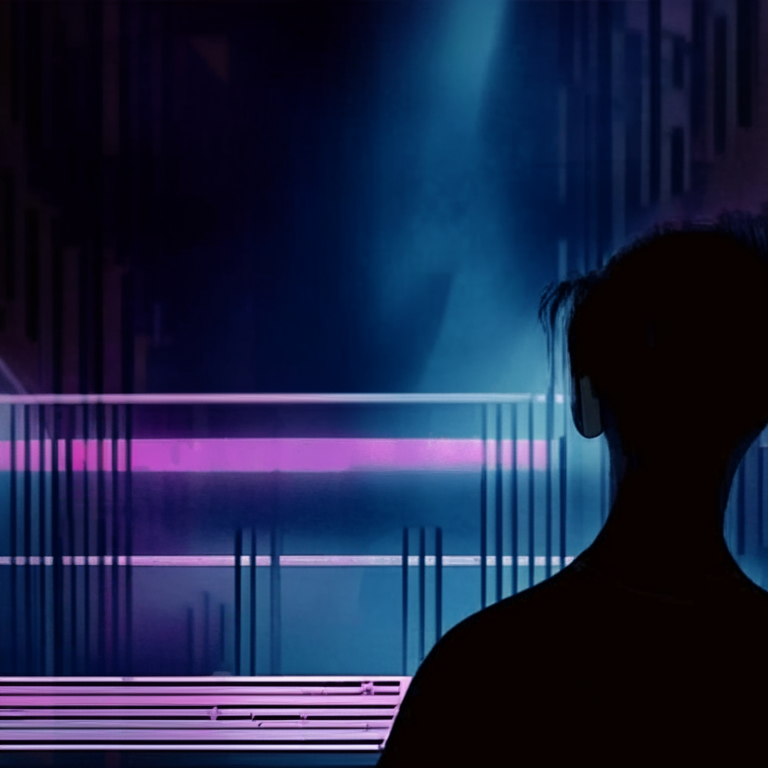

In [ ]:
from diffusers import KandinskyPriorPipeline, KandinskyPipeline
from diffusers.utils import load_image, make_image_grid
import torch

prior_pipeline = KandinskyPriorPipeline.from_pretrained("kandinsky-community/kandinsky-2-1-prior", torch_dtype=torch.float16, use_safetensors=True).to("cuda")

images_texts = ["The low quality recording features a sustained strings melody. The recording is noisy and in mono.", img_1, img_2, img_3]
weights = [0.4, 0.2, 0.2, 0.2]

prompt = ''

prior_out = prior_pipeline.interpolate(images_texts, weights)

pipeline = KandinskyPipeline.from_pretrained("kandinsky-community/kandinsky-2-1", torch_dtype=torch.float16, use_safetensors=True).to("cuda")

image = pipeline(prompt, **prior_out, height=768, width=768).images[0]
display(image)

In [ ]:
#@title Artwork Image Generation
#@markdown Re-run this cell to generate a new artwork image


final_prompt = prompt_select.value
print(final_prompt)
pipeline_output = pipe(final_prompt, width=512, height=512)
images = pipeline_output.images

image = images[0]

clear_output()
display(image)

save_image_file(image, prompt=final_prompt)